In [1]:
import os
import csv
#from Bio import SeqIO
import os
import matplotlib as mpl
from matplotlib import pyplot as plt
import seaborn as sns
import collections
import numpy as np
import pandas as pd
#import datetime
#from datetime import date
#import skbio
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.path as mpath
import matplotlib.lines as mlines
#import random
#import collections
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
from matplotlib.patches import Polygon
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

from matplotlib.collections import PatchCollection
import csv

In [4]:
amplicons = collections.defaultdict(list)
with open("primer_scheme.txt","r") as f:
    for l in f:
        ref,start,end,name,pool,strand = l.rstrip("\n").split("\t")
#         print(l)
        name_stem = '_'.join(name.split('_')[:2])
        
        amplicons[name_stem].append(int(start))
        amplicons[name_stem].append(int(end))

records = []
coords = {}
for amplicon in amplicons:
    coords[amplicon]=[sorted(amplicons[amplicon])[0], sorted(amplicons[amplicon])[-1]]

lasts,laste=0,0
start,end=0,0
nexts,nexte=0,0
current_amplicon = ""
last_amplicon = ""
third_last_amplicon = ''
second_last_amplicon = ''
c =0
s = 0
for amplicon in coords:
    #print(amplicon, coords[amplicon])
    next_amplicon=amplicon
    
    #print(last_amplicon,current_amplicon,next_amplicon)

    try:
        coords[last_amplicon],coords[current_amplicon],coords[next_amplicon]
    except:
        pass
    
    # triple
    try:
        third_last_start = coords[third_last_amplicon][1]
    except:
        third_last_start = 0

    try:
        third_last_end = coords[next_amplicon][0]
    except:
        third_last_end = 29904
    

    
    triple_missing = [third_last_start,third_last_end]    
    #print("Triple",triple_missing)
    
def get_parent(lineage):
    alias = {
        "A": "",
    "B": "",
    "C": "B.1.1.1",
    "D": "B.1.1.25",
    "G": "B.1.258.2",
    "K": "B.1.1.277",
    "L": "B.1.1.10",
    "M": "B.1.1.294",
    "N": "B.1.1.33",
    "P": "B.1.1.28",
    "Q": "B.1.1.7",
    "R": "B.1.1.316",
    "S": "B.1.1.217",
    "U": "B.1.177.60",
    "V": "B.1.177.54",
    "W": "B.1.177.53",
    "Y": "B.1.177.52",
    "Z": "B.1.177.50",
    "AA": "B.1.177.15",
    "AB": "B.1.160.16",
    "AC": "B.1.1.405",
    "AD": "B.1.1.315",
    "AE": "B.1.1.306",
    "AF": "B.1.1.305",
    "AG": "B.1.1.297",
    "AH": "B.1.1.241",
    "AJ": "B.1.1.240",
    "AK": "B.1.1.232",
    "AL": "B.1.1.231",
    "AM": "B.1.1.216",
    "AN": "B.1.1.200",
    "AP": "B.1.1.70",
    "AQ": "B.1.1.39",
    "AS": "B.1.1.317",
    "AT": "B.1.1.370",
    "AU": "B.1.466.2",
    "AV": "B.1.1.482",
    "AW": "B.1.1.464",
    "AY": "B.1.617.2",
    "AZ": "B.1.1.318",
    "BA": "B.1.1.529",
    "BB": "B.1.621.1",
    "XA": ["B.1.1.7","B.1.177"],
    "XB": ["B.1.634","B.1.631"],
    "XC": ["AY.29","B.1.1.7"]}
    default_mapping = {"B":"A"}
    lin_list = lineage.split(".")
    
    if lineage == "B":
        parent = "A"

    elif lin_list[0] in alias and len(lin_list) == 2:
        parent = alias[lin_list[0]]
    
    else:
        parent = ".".join(lin_list[:-1])
    return parent

with open ('des_lineages.csv','r') as file:
    reader=csv.DictReader(file)
    designated_dict = {rows['taxon']:rows['lineage'] for rows in reader}
    


In [5]:
def replace(string):
    char_to_replace = {', ': ' ',') ': ')'}
    for key, value in char_to_replace.items():
        string = string.replace(key, value)
    return(string)

def replace_dt(string):
    char_to_replace = {'_dropout': ' dropout','_coords':' coords',')_': ')','__':' '}
    for key, value in char_to_replace.items():
        string = string.replace(key, value)
    return(string)    

# Random Forest

In [6]:
with open("rf_parsed_mid.triple.csv","w") as fw:
    fw.write("start,end,midpoint,status\n")
    with open("pangolearn_report.amplicon_dropout.csv","r") as f:
        reader = csv.DictReader(f)
        for row in reader:
            description = row["taxon"]
            description = replace(description)
            assigned_lineage = row["lineage"]
            
            seq_name,dropout,start,end=description.split(" ")
            
            lineage = designated_dict[seq_name]
            ancestry = []
            parent = lineage

            start = start.lstrip("coords=(")
            end = end.rstrip(")").lstrip()
            c =0
            while "A" not in ancestry and c<10:
                c+=1
                parent = get_parent(parent)
                if parent:
                    ancestry.append(parent)

            if assigned_lineage == lineage:
                status = "Correct"
            elif assigned_lineage in ancestry:
                status = "Ancestor"
            else:
                status = "Incorrect"
            midpoint = (int(start)+int(end))/2
            fw.write(f"{start},{end},{midpoint},{status}\n")

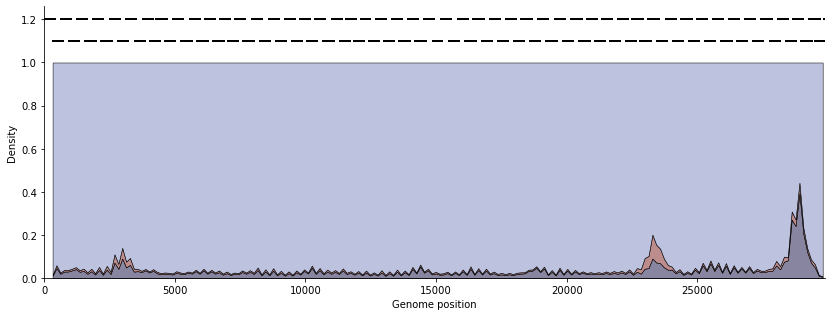

In [106]:
rf = pd.read_csv("rf_parsed_mid.triple.csv")
#rf.drop(rf.tail(15342).index,inplace=True)

#rf.drop(rf.head(15432).index,inplace=True)
#data.groupby('start').count()
fig,ax= plt.subplots(figsize=(14,5),facecolor='w',frameon=False)

my_pal = {"Correct": "#929AC9", "Ancestor": "#393461", "Incorrect": "#924242"}
[ax.spines[loc].set_visible(False) for loc in ['top','right']]
sns.kdeplot(data=rf, x="midpoint",fill=True,bw_adjust=0.15,cut=0,linewidth=0.5,common_norm=True,legend=False,hue="status",multiple="fill",palette=my_pal,alpha=0.6)
c = 0
for amplicon in coords:
    c+=1
    if c%2:
        y = 1.2
    else:
        y= 1.1
    x1,x2 = coords[amplicon]
    plt.plot((x1, x2), (y, y), 'k-',linewidth=2)
    

plt.xlim(0,29903)

plt.xlabel("Genome position\n");

plt.savefig("rf_amplicon_triple_mid.3.svg");
plt.savefig("rf_amplicon_triple_mid.3.png",bbox_inches='tight', 
               transparent=True);

plt.show();

# Decision Tree

In [74]:
with open("dt_parsed_mid.triple.csv","w") as fw:
    fw.write("name,start,end,midpoint,status\n")
    with open("pangolearn_dt.amplicon.processed_report.csv","r") as f:
        reader = csv.DictReader(f)
        for row in reader:
            description = row["taxon"]
            description = replace_dt(description)
            assigned_lineage = row["lineage"]
            
            seq_name,dropout,start,end=description.split(" ")
            
            lineage = designated_dict[seq_name]
            ancestry = []
            parent = lineage

            start = start.lstrip("coords=(")
            end = end.rstrip(")").lstrip()
            c =0
            while "A" not in ancestry and c<10:
                c+=1
                parent = get_parent(parent)
                if parent:
                    ancestry.append(parent)

            if assigned_lineage == lineage:
                status = "Correct"
            elif assigned_lineage in ancestry:
                status = "Ancestor"
            else:
                status = "Incorrect"
            midpoint = (int(start)+int(end))/2
            fw.write(f"{seq_name},{start},{end},{midpoint},{status}\n")

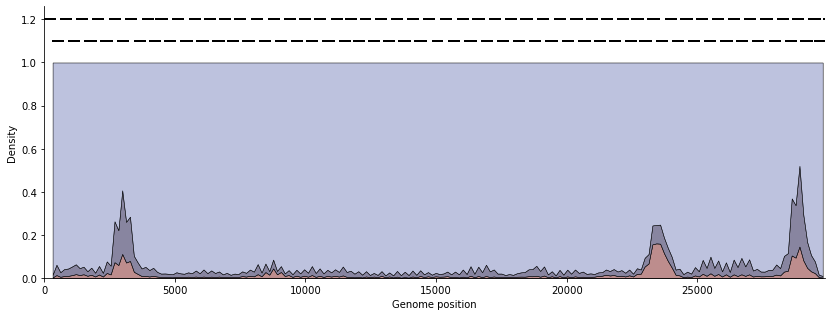

In [43]:
#dt.drop(dt.tail(15342).index,inplace=True)

#dt.drop(dt.head(15432).index,inplace=True)

fig,ax= plt.subplots(figsize=(14,5),facecolor='w',frameon=False)

my_pal = {"Correct": "#929AC9", "Ancestor": "#393461", "Incorrect": "#924242"}
[ax.spines[loc].set_visible(False) for loc in ['top','right']]
sns.kdeplot(data=dt, x="midpoint",cut=0,fill=True,bw_adjust=0.15,linewidth=0.5,common_norm=True,legend=False,hue="status",multiple="fill",palette=my_pal,alpha=0.6)
c = 0
for amplicon in coords:
    c+=1
    if c%2:
        y = 1.2
    else:
        y= 1.1
    x1,x2 = coords[amplicon]
    plt.plot((x1, x2), (y, y), 'k-',linewidth=2)
    

plt.xlim(0,29903)

plt.xlabel("Genome position\n");

plt.savefig("dt_amplicon_triple_mid.3.svg");
plt.savefig("dt_amplicon_triple_mid.3.png",bbox_inches='tight', 
               transparent=True);

plt.show();

In [44]:

dt_count=dt.groupby(['start','status']).count().unstack(level=-1)

dt_unstack=dt_count.set_axis(['A1', 'C1', 'I1', 'A2', 'C2','I2'], axis=1, inplace=False)
dt_unstack
dt_unstack.sort_values(by=['C1']).head(50)

,A1,C1,I1,A2,C2,I2
start,,,,,,
28779,2320,4144,955,2320,4144,955
28464,2318,4156,946,2318,4156,946
2904,1806,4888,738,1806,4888,738
2592,1800,4924,700,1800,4924,700
23214,708,5131,1591,708,5131,1591
23522,541,6220,672,541,6220,672
22903,470,6267,690,470,6267,690
26590,468,6836,122,468,6836,122
26315,460,6865,104,460,6865,104


In [4]:
def write_peak_csv(infile,outfile,peak):
    with open(outfile,"w") as fw:
        fw.write("lineage,assigned_lineage,status\n")
        with open(infile,"r") as f:
            reader = csv.DictReader(f)
            for row in reader:
                description = row["taxon"]
                description = replace_dt(description)
                assigned_lineage = row["lineage"]

                seq_name,dropout,start,end=description.split(" ")

                lineage = designated_dict[seq_name]
                ancestry = []
                parent = lineage

                start = start.lstrip("coords=(")
                end = end.rstrip(")").lstrip()
                c =0

                if (start==peak):
                    while "A" not in ancestry and c<10:
                        c+=1
                        parent = get_parent(parent)
                        if parent:
                            ancestry.append(parent)

                    if assigned_lineage == lineage:
                        status = "Correct"
                    elif assigned_lineage in ancestry:
                        status = "Ancestor"
                    else:
                        status = "Incorrect"
                    fw.write(f"{lineage},{assigned_lineage},{status}\n")

                
            
def make_sankey(infile,status):    
    peak=pd.read_csv(infile,index_col=False)
    peak_filter=peak.loc[peak['status']==status]
    san=peak_filter.groupby(by=['lineage','assigned_lineage']).size()
    san=san.reset_index(name='count')
    san['lineage']='Designated '+san['lineage']
    san['assigned_lineage']='Drop_out '+san['assigned_lineage']
    return san

            

In [108]:
write_peak_csv('pangolearn_dt.amplicon.processed_report.csv','peak28779.csv','28779')

In [135]:
write_peak_csv('pangolearn_dt.amplicon.processed_report.csv','peak23214.csv','23214')

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
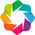

In [2]:
import holoviews as hv
hv.extension("bokeh")

In [102]:
peak2904=pd.read_csv("peak2904.csv",index_col=False)

peak2904_anc=peak2904.loc[peak2904['status']=='Incorrect']

san2904=peak2904_anc.groupby(by=['lineage','assigned_lineage']).size()


san2904=san2904.reset_index(name='count')
san2904['lineage']='Designated '+san2904['lineage']
san2904['assigned_lineage']='Drop_out '+san2904['assigned_lineage']
san2904

,lineage,assigned_lineage,count
0,Designated A.16,Drop_out A,3
1,Designated A.18,Drop_out A,4
2,Designated A.18,Drop_out B,1
3,Designated A.22,Drop_out A,5
4,Designated A.25,Drop_out A,1
...,...,...,...
292,Designated C.17,Drop_out C.35,1
293,Designated C.37.1,Drop_out AY.52,1
294,Designated C.40,Drop_out C.39,4
295,Designated L.3,Drop_out B.1.1.409,1


## DT Orf1a peak

In [5]:
sankey2904=hv.Sankey(make_sankey('peak2904.csv','Ancestor'))
sankey2904.opts(width=800, height=500,node_sort=True,
                        label_position='outer', node_width=20,label_text_font_size='10pt',edge_alpha=0.3)

:Sankey   [lineage,assigned_lineage]   (count)

In [6]:
sankey2904=hv.Sankey(make_sankey('peak2904.csv','Incorrect'))
sankey2904.opts(width=800, height=500,node_sort=True,
                        label_position='outer', node_width=20,label_text_font_size='10pt',edge_alpha=0.3)

:Sankey   [lineage,assigned_lineage]   (count)

## DT S peak


In [8]:
sankey23214=hv.Sankey(make_sankey('peak23214.csv','Ancestor'))
sankey23214.opts(width=800, height=600,node_sort=True,
                        label_position='outer', node_width=20,label_text_font_size='8pt',edge_alpha=0.3)

:Sankey   [lineage,assigned_lineage]   (count)

In [7]:
sankey23214=hv.Sankey(make_sankey('peak23214.csv','Incorrect'))
sankey23214.opts(width=800, height=600,node_sort=True,
                        label_position='outer', node_width=20,label_text_font_size='8pt',edge_alpha=0.3)


:Sankey   [lineage,assigned_lineage]   (count)

## DT N peak

In [10]:
sankey28779=hv.Sankey(make_sankey('peak28779.csv','Ancestor'))
sankey28779.opts(width=800, height=600,node_sort=True,
                        label_position='outer', node_width=20,label_text_font_size='8pt',edge_alpha=0.3)

:Sankey   [lineage,assigned_lineage]   (count)

In [9]:
sankey28779=hv.Sankey(make_sankey('peak28779.csv','Incorrect'))
sankey28779.opts(width=800, height=600,node_sort=True,
                        label_position='outer', node_width=20,label_text_font_size='8pt',edge_alpha=0.3)




:Sankey   [lineage,assigned_lineage]   (count)

# Random forest peak sankey

In [169]:
rf=pd.read_csv('rf_parsed_mid.triple.csv')
rf_count=rf.groupby(['start','status']).count().unstack(level=-1)

rf_unstack=rf_count.set_axis(['A1', 'C1', 'I1', 'A2', 'C2','I2'], axis=1, inplace=False)
rf_unstack
rf_unstack.sort_values(by=['C1']).head(50)

,A1,C1,I1,A2,C2,I2
start,,,,,,
28464,2444,4908,319,2444,4908,319
28779,2413,4924,334,2413,4924,334
23214,633,6247,791,633,6247,791
22903,529,6397,745,529,6397,745
2592,523,6843,305,523,6843,305
2904,503,6863,305,503,6863,305
27854,433,7039,199,433,7039,199
25369,369,7227,75,369,7227,75
25076,352,7249,70,352,7249,70


In [145]:
def RF_write_peak_csv(infile,outfile,peak):
    with open(outfile,"w") as fw:
        fw.write("lineage,assigned_lineage,status\n")
        with open(infile,"r") as f:
            reader = csv.DictReader(f)
            for row in reader:
                description = row["taxon"]
                description = replace(description)
                assigned_lineage = row["lineage"]

                seq_name,dropout,start,end=description.split(" ")

                lineage = designated_dict[seq_name]
                ancestry = []
                parent = lineage

                start = start.lstrip("coords=(")
                end = end.rstrip(")").lstrip()
                c =0

                if (start==peak):
                    while "A" not in ancestry and c<10:
                        c+=1
                        parent = get_parent(parent)
                        if parent:
                            ancestry.append(parent)

                    if assigned_lineage == lineage:
                        status = "Correct"
                    elif assigned_lineage in ancestry:
                        status = "Ancestor"
                    else:
                        status = "Incorrect"
                    fw.write(f"{lineage},{assigned_lineage},{status}\n")


In [146]:
RF_write_peak_csv('pangolearn_report.amplicon_dropout.csv','peak2592_rf.csv','2592')
RF_write_peak_csv('pangolearn_report.amplicon_dropout.csv','peak28464_rf.csv','28464')
RF_write_peak_csv('pangolearn_report.amplicon_dropout.csv','peak23214_rf.csv','23214')

## RF Orf1a peak

In [160]:
sankey2592_rf=hv.Sankey(make_sankey('peak2592_rf.csv','Ancestor'))
sankey2592_rf.opts(width=800, height=500,node_sort=True,
                        label_position='outer', node_width=20,label_text_font_size='10pt',edge_alpha=0.3)

:Sankey   [lineage,assigned_lineage]   (count)

In [161]:
sankey2592_rf=hv.Sankey(make_sankey('peak2592_rf.csv','Incorrect'))
sankey2592_rf.opts(width=800, height=500,node_sort=True,
                        label_position='outer', node_width=20,label_text_font_size='10pt',edge_alpha=0.3)

:Sankey   [lineage,assigned_lineage]   (count)

## RF S peak

In [162]:
sankey23214_rf=hv.Sankey(make_sankey('peak23214_rf.csv','Ancestor'))
sankey23214_rf.opts(width=800, height=500,node_sort=True,
                        label_position='outer', node_width=20,label_text_font_size='10pt',edge_alpha=0.3)

:Sankey   [lineage,assigned_lineage]   (count)

In [163]:
sankey23214_rf=hv.Sankey(make_sankey('peak23214_rf.csv','Incorrect'))
sankey23214_rf.opts(width=800, height=500,node_sort=True,
                        label_position='outer', node_width=20,label_text_font_size='10pt',edge_alpha=0.3)

:Sankey   [lineage,assigned_lineage]   (count)

## RF N peak

In [164]:
sankey28464_rf=hv.Sankey(make_sankey('peak28464_rf.csv','Ancestor'))
sankey28464_rf.opts(width=800, height=500,node_sort=True,
                        label_position='outer', node_width=20,label_text_font_size='10pt',edge_alpha=0.3)

:Sankey   [lineage,assigned_lineage]   (count)

In [167]:
sankey28464_rf=hv.Sankey(make_sankey('peak28464_rf.csv','Incorrect'))
sankey28464_rf.opts(width=800, height=500,node_sort=True,
                        label_position='outer', node_width=20,label_text_font_size='10pt',edge_alpha=0.3)

:Sankey   [lineage,assigned_lineage]   (count)